# Unsupervise Analysis of kinase378
## parts: 
### 1. normalization
### 2. UMAP

In [21]:
#!pip install cytominer-eval
import os
import pandas as pd 
import numpy as np
import matplotlib  as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

%matplotlib inline
import os, shutil, glob
from PIL import Image
from random import randint
# import re, math
import seaborn as sns; sns.set_style("white")
# from sklearn.manifold import TSNE
import datetime
import gc
from pathlib import Path
from cytominer_eval import evaluate
import scanpy as sc 
from sklearn.decomposition import PCA
import polars as pl

In [22]:
print(os.getcwd())

/share/data/analyses/sofia/kinase378-vt1/ConformalPrediction_Sofia/CellProfiler


### set up 

In [23]:
# settings to display more columns and rows
pd.set_option("max_colwidth", 200)
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

## creating df and merging

In [24]:
# get parquet file
FFI_PARQUET = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/ImageMeanFeatures/ImageMeanPlateAllPlates.parquet'
META = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/metadata_improved.csv'

metadata = pd.read_csv(f'{META}', sep=';', index_col=[0])
df = pd.read_parquet(f'{FFI_PARQUET}')
df = df.iloc[:, :-2]
print("features df shape:", df.shape)
display(df.head(2))
print("metadata shape:", metadata.shape)
metadata = metadata.rename(columns = {"cbkid": "compound_id", "well_id" : "well", 'batchid':'batch_id', 'ANNOTATION':'cmpd_name'})
display(metadata.head(2))

features df shape: (49712, 2130)


,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_0_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_Zerni

metadata shape: (48058, 31)


,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,Metadata_Barcode,ImageID,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name
0,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230,P015230_B02_1,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221
1,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230,P015230_B02_2,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221


In [25]:
df.dropna(inplace=True)
print(df.shape)
df  = df[df['ObjectNumber_nuclei'] >= 5] # drop images that have less than 10 cells
df.shape
df.reset_index(drop=True, inplace=True)
df.head(2)
#add new columns
df['Metadata_Site'] = df['Metadata_Site'].astype(int).astype(str)
df['ImageID'] = df['Metadata_Barcode'] + '_' + df['Metadata_Well'] + '_' + df['Metadata_Site']
df['plateWell'] = df['Metadata_Barcode'] + '_' + df['Metadata_Well']

display(df.tail(2))
df.shape

(48833, 2130)


,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_0_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePha

(48235, 2131)

In [26]:
df_merged = pd.merge(df, metadata, how='left',left_on=['Metadata_Barcode','ImageID'], right_on=['Metadata_Barcode', 'ImageID' ])

In [27]:
df = df_merged.copy()

# already done in the previous cell
#df.rename(columns={'batchid_x':'batchid', 'cbkid_x':'cbkid', 'plateWell_y':'plateWell'}, inplace=True)

In [28]:
# df.dropna(subset = ['compound'], inplace=True)
# df.reset_index(drop=True, inplace=True)
# df.tail(3)

In [29]:
#df.compound_id.unique()

In [30]:
df.dropna(subset = ['compound_id'], inplace=True)
df.reset_index(drop=True, inplace=True)
df.tail()

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name
45329,P015249_O23_5,P015249,O23,1.0,62.0,1542.0,5,1192.065041,1723.081301,1176.707317,1165.804878,1135.593496,1124.902439,1155.812256,1144.952271,1.375233,1287.382114,0.703623,38.149323,1.121951,0.710346,0.807938,47.827572,47.266277,15.200496,5.952336,5.361162,31.982321,32.226852,-4.912338,134.727951,0.940031,0.675655,0.052137,0.146418,0.080805,0.018710,0.014459,0.029268,0.019399,0.021148,0.013736,0.012277,0.007881,0.011124,0.014429,0.010368,0.008530,0.008237,0.007718,...,0.010822,-0.194856,-0.012018,0.153312,0.070757,-0.187664,0.033046,0.227037,0.149535,0.133585,-0.159603,-0.077856,0.212270,-0.024758,0.115779,0.180931,0.140046,-0.389217,0.197391,-0.233132,P015249_O23,kinase378-v1-plate3-L6,O23,BJ1856310,DMSO,10.0,5.0,40.0,trt,1.25,HOG,1200.0,BJ1856310,CBK293863,Lib-2049,Selleck_known_kinase_inhibitors,COc1cc(ccc1Nc1ncc(Cl)c(n1)-c1c[nH]c2ccccc12)N1CCC(N)CC1,"InChI=1S/C24H25ClN6O/c1-32-22-12-16(31-10-8-15(26)9-11-31)6-7-21(22)29-24-28-14-19(25)23(30-24)18-13-27-20-5-3-2-4-17(18)20/h2-7,12-15,27H,8-11,26H2,1H3,(H,28,29,30)",GCYIGMXOIWJGBU-UHFFFAOYSA-N,P015249_O23,P015249,384.0,2022-03-08 11:39:37,BD Falcon 353962,48.0,2022-03-10,NaN,NaN,Alk,AZD3463
45330,P015249_O23_6,P015249

In [31]:
CompoundList = sorted(list(set(df['compound_id'].astype(str))))
print(len(CompoundList))
print(CompoundList[-7:])
PlateList = sorted(list(set(df['Metadata_Barcode'])))
print(PlateList)
CelllineList = sorted(list(set(df['cell_line'])))
print(CelllineList)
print(len(CelllineList))
#set(df['cell_line']) #check what is in this column?

383
['CBK293913C', '[berb]', '[dmso]', '[etop]', '[fenb]', '[flup]', '[tetr]']
['P015230', 'P015231', 'P015232', 'P015233', 'P015234', 'P015235', 'P015236', 'P015237', 'P015238', 'P015239', 'P015240', 'P015242', 'P015244', 'P015245', 'P015246', 'P015247', 'P015248', 'P015249']
['A549', 'HOG', 'U2OS']
3


In [32]:
QC = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/Flags.csv'
QC = pd.read_csv(f'{QC}', sep=';', index_col=[0])
QC.dtypes
QC['Metadata_Site'] = QC['Metadata_Site'].astype(str)
QC['Total'].value_counts()

Total
0    48751
1     1145
Name: count, dtype: int64

In [33]:
# merging and dropping
df_merged = df.merge(QC, left_on = ['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'cell_line'] , right_on = ['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'cell_line'] , how = 'left')
print("df_merged", df_merged.shape)
df_merged = df_merged[df_merged['Total'] == 0 ]
print("df_merged:", df_merged.shape)

df_merged (45334, 2163)
df_merged: (44642, 2163)


In [34]:
#df_merged.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/data/df_merged.csv', sep=';', index=False)

## df_merged can be used from this point on

In [35]:
ControlCompounds = CompoundList[-6:]
display(ControlCompounds)
ControlCompounds = ['[dmso]', '[berb]',  '[etop]', '[fenb]', '[flup]', '[tetr]']
display(ControlCompounds)


['[berb]', '[dmso]', '[etop]', '[fenb]', '[flup]', '[tetr]']

['[dmso]', '[berb]', '[etop]', '[fenb]', '[flup]', '[tetr]']

In [36]:
# # CREATING A DATAFRAME FOR EACH CELL LINE and saving them in a csv file :)
df_U2OS= df_merged[df_merged['cell_line'] == 'U2OS']
df_U2OS.reset_index(drop=True, inplace=True)
print(df_U2OS.shape)
#df_U2OS.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/df_U2OS.csv', sep=';', index=False)


(15423, 2163)


In [37]:
df_U2OS.head(1)

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,Total
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,2131.795181,2931.445783,960.638554,1125.457831,907.457831,1072.060241,933.689453,1098.178223,1.260955,2202.638554,0.717754,50.479679,1.0,0.73145,0.804235,63.141754,62.866806,20.120483,7.80568,7.041424,41.041996,41.450008,8.326373,176.673447,0.96503,0.655136,0.044279,0.153259,0.079043,0.018,0.015624,0.029609,0.020195,0.023385,0.013351,0.01221,0.007129,0.010855,0.015658,0.009367,0.01002,0.007887,0.007845,...,-0.167023,0.211002,-0.023631,0.205681,-0.007268,-0.174204,0.15258,0.372422,-0.147382,-0.164113,0.234112,-0.307315,0.062425,-0.249644,0.057171,0.026649,-0.112131,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221,72,U2OS_P015230,0


In [38]:
df_U2OS.compound_id.unique()

array(['CBK278070', 'CBK278013', 'CBK041209', 'CBK290556', 'CBK149343H',
       'CBK278042', '[tetr]', 'CBK288259', 'CBK290660', 'CBK277966',
       'CBK290567', 'CBK290480', 'CBK176259G', '[dmso]', 'CBK290589',
       'CBK293852', 'CBK290585', 'CBK277936', 'CBK277931', 'CBK278049',
       '[fenb]', 'CBK288288', 'CBK288312', 'CBK288299', 'CBK288286G',
       'CBK288287', 'CBK290253', 'CBK041232C', 'CBK288297', 'CBK277993',
       'CBK288261', 'CBK277967', 'CBK278088', 'CBK290527N', 'CBK277977',
       'CBK290484', 'CBK288271', '[berb]', 'CBK277923', 'CBK278001',
       'CBK278000H', 'CBK288328', 'CBK278121G', 'CBK277998', 'CBK288278',
       'CBK288289', 'CBK169041', 'CBK288318', 'CBK041168', 'CBK278119G',
       '[flup]', 'CBK016914', 'CBK277985', 'CBK277951', 'CBK201014C',
       'CBK277995', 'CBK290482', 'CBK288272', 'CBK288253C', 'CBK040864',
       'CBK278044', 'CBK288298', 'CBK201383', 'CBK290339', 'CBK277956',
       'CBK288283', 'CBK290490', 'CBK277940', 'CBK041801', 'CBK288257

In [39]:
df_U2OS.Metadata_Barcode.unique()

array(['P015230', 'P015236', 'P015244', 'P015231', 'P015237', 'P015245'],
      dtype=object)

## MAD SCORE CALCULATION AND Z-SCORE

In [40]:
from unsupervised import * 
X, varying_features = numeric_columns(df_U2OS, df_merged)
U2OS_varying_features = varying_features
U2OS_varying_features = U2OS_varying_features[:-6]
U2OS_varying_features

Head of numeric columns:
   ImageNumber_nuclei  ObjectNumber_nuclei  Metadata_AcqID  \
0                 1.0                 42.0          1362.0   
1                 1.0                 43.5          1362.0   
2                 1.0                 74.0          1362.0   
3                 1.0                 50.5          1362.0   
4                 1.0                 47.0          1362.0   

   AreaShape_Area_nuclei  AreaShape_BoundingBoxArea_nuclei  \
0            2131.795181                       2931.445783   
1            2142.441860                       3018.011628   
2            2278.931973                       3178.394558   
3            2338.490000                       3238.780000   
4            2268.139785                       3196.752688   

   AreaShape_BoundingBoxMaximum_X_nuclei  \
0                             960.638554   
1                            1010.279070   
2                            1063.979592   
3                            1083.560000   
4        

['AreaShape_Area_nuclei',
 'AreaShape_BoundingBoxArea_nuclei',
 'AreaShape_BoundingBoxMaximum_X_nuclei',
 'AreaShape_BoundingBoxMaximum_Y_nuclei',
 'AreaShape_BoundingBoxMinimum_X_nuclei',
 'AreaShape_BoundingBoxMinimum_Y_nuclei',
 'AreaShape_Center_X_nuclei',
 'AreaShape_Center_Y_nuclei',
 'AreaShape_Compactness_nuclei',
 'AreaShape_ConvexArea_nuclei',
 'AreaShape_Eccentricity_nuclei',
 'AreaShape_EquivalentDiameter_nuclei',
 'AreaShape_Extent_nuclei',
 'AreaShape_FormFactor_nuclei',
 'AreaShape_MajorAxisLength_nuclei',
 'AreaShape_MaxFeretDiameter_nuclei',
 'AreaShape_MaximumRadius_nuclei',
 'AreaShape_MeanRadius_nuclei',
 'AreaShape_MedianRadius_nuclei',
 'AreaShape_MinFeretDiameter_nuclei',
 'AreaShape_MinorAxisLength_nuclei',
 'AreaShape_Orientation_nuclei',
 'AreaShape_Perimeter_nuclei',
 'AreaShape_Solidity_nuclei',
 'AreaShape_Zernike_0_0_nuclei',
 'AreaShape_Zernike_1_1_nuclei',
 'AreaShape_Zernike_2_0_nuclei',
 'AreaShape_Zernike_2_2_nuclei',
 'AreaShape_Zernike_3_1_nuclei',


In [41]:
## calculate mediad values for DMSO -- standarization
dfDMSO = df_U2OS[df_U2OS['compound_id'] == '[dmso]']  # Calculate median values for DMSO
dfDMSO_MADs = (dfDMSO[U2OS_varying_features] - dfDMSO[U2OS_varying_features].median()).abs().median() # Calculate median absolute deviations for DMSO
print(len(U2OS_varying_features))
U2OS_varying_in_DMSO = dfDMSO_MADs.loc[dfDMSO_MADs > 0.0001].index # Remove features that are invariant or close to invariant in DMSO
len(U2OS_varying_in_DMSO)

2015


1728

In [42]:
U2OS_varying_in_DMSO

Index(['AreaShape_Area_nuclei', 'AreaShape_BoundingBoxArea_nuclei',
       'AreaShape_BoundingBoxMaximum_X_nuclei',
       'AreaShape_BoundingBoxMaximum_Y_nuclei',
       'AreaShape_BoundingBoxMinimum_X_nuclei',
       'AreaShape_BoundingBoxMinimum_Y_nuclei', 'AreaShape_Center_X_nuclei',
       'AreaShape_Center_Y_nuclei', 'AreaShape_Compactness_nuclei',
       'AreaShape_ConvexArea_nuclei',
       ...
       'RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm',
       'RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm',


In [43]:
df_U2OS.head(1)

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell_y,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,Total
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,2131.795181,2931.445783,960.638554,1125.457831,907.457831,1072.060241,933.689453,1098.178223,1.260955,2202.638554,0.717754,50.479679,1.0,0.73145,0.804235,63.141754,62.866806,20.120483,7.80568,7.041424,41.041996,41.450008,8.326373,176.673447,0.96503,0.655136,0.044279,0.153259,0.079043,0.018,0.015624,0.029609,0.020195,0.023385,0.013351,0.01221,0.007129,0.010855,0.015658,0.009367,0.01002,0.007887,0.007845,...,-0.167023,0.211002,-0.023631,0.205681,-0.007268,-0.174204,0.15258,0.372422,-0.147382,-0.164113,0.234112,-0.307315,0.062425,-0.249644,0.057171,0.026649,-0.112131,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,NaN,TGX-221,72,U2OS_P015230,0


In [44]:
len(df_U2OS.therapeutic_class_2023.unique())

83

In [45]:
import pandas as pd

# Assuming df_U2OS, dfDMSO_Medians, and dfDMSO_MADs are already loaded and structured correctly.

# Get unique plate barcodes from the dataset.
plates = df_U2OS.Metadata_Barcode.unique()

# Create an empty list to store z-score DataFrames for each plate.
zscore_dfs = []

for plate in plates:
    # Filter the data for each plate.
    df_plate = df_U2OS[df_U2OS['Metadata_Barcode'] == plate]
    dfDMSO_Medians = df_plate[U2OS_varying_features].median()
    dfDMSO_MADs = (df_plate[U2OS_varying_features] - df_plate[U2OS_varying_features].median()).abs().median() # Calculate median absolute deviations for DMSO
    # Calculate the z-scores for the columns specified in U2OS_varying_in_DMSO.
    df_plate_zscores = (df_plate[U2OS_varying_in_DMSO] - dfDMSO_Medians[U2OS_varying_in_DMSO]) / dfDMSO_MADs[U2OS_varying_in_DMSO]
    
    # Add the metadata columns back to the z-score DataFrame.
    df_plate_zscores = pd.concat([df_plate_zscores, df_plate[['Metadata_Barcode',  
                                                               'Metadata_Well', 
                                                               'Metadata_Site', 
                                                               'Count_nuclei',
                                                               'compound_id',
                                                               'cmpd_conc',
                                                               'cmpd_name',  
                                                               'Family',
                                                               'therapeutic_class_2023',
                                                               'ImageID']]], axis=1)
    
    # Add ReplicateGroup and Replicate columns.
    df_plate_zscores['ReplicateGroup'] = df_plate_zscores['compound_id'] + '_' + df_plate_zscores['cmpd_conc'].astype(str) 
    df_plate_zscores['Replicate'] = df_plate_zscores['ReplicateGroup'] + '_' + df_plate_zscores['ImageID']
    
    # Append the processed DataFrame for this plate to the list.
    zscore_dfs.append(df_plate_zscores)

# Concatenate all plate-specific z-score DataFrames into a single DataFrame.
U2OS_dfZscores = pd.concat(zscore_dfs, axis=0).reset_index(drop=True)

# Display the first few rows of the final z-score DataFrame.
U2OS_dfZscores.head(5)

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate
0,-1.795443,-2.226389,-2.188277,0.279302,-2.115006,0.333097,-2.149275,0.307541,-1.138062,-1.828354,-1.744247,-2.338716,2.610160,1.2

In [46]:
# to check if the standardization was done correctly, 
# we checkt the features in DMSO and then should be 0 or close to 0
dmso = U2OS_dfZscores[U2OS_dfZscores.compound_id == "[dmso]"] 
dmso[dmso.Metadata_Barcode=='P015230'][U2OS_varying_in_DMSO].median()

AreaShape_Area_nuclei                                     -0.188915
AreaShape_BoundingBoxArea_nuclei                          -0.229482
AreaShape_BoundingBoxMaximum_X_nuclei                      0.101070
AreaShape_BoundingBoxMaximum_Y_nuclei                     -0.077542
AreaShape_BoundingBoxMinimum_X_nuclei                      0.119902
                                                             ...   
RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm    0.002681
RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm    0.142351
RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm    0.022767
RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm    0.002772
RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm   -0.052109
Length: 1728, dtype: float64

In [89]:
#this z-scores are calculated for each plate separately and then mereged into one dataframe
U2OS_dfZscores.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_dfZscores.csv', sep=';', index=False)

In [48]:
U2OS_dfZscores.shape

(15423, 1740)

### gritscore

In [49]:
features = list(U2OS_dfZscores[U2OS_varying_in_DMSO])

meta_features = list(U2OS_dfZscores.columns[-12:])
print(meta_features)
control_perts = U2OS_dfZscores.query("compound_id == '[dmso]'").Replicate.unique().tolist() # This makes a list of wells that contain DMSO
print(len(control_perts))

['Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate']
1080


In [50]:
grit_replicate_groups = {
    "profile_col": "Replicate", 
     "replicate_group_col": "ReplicateGroup" 
}

In [51]:
U2OS_dfZscores.Metadata_Barcode.unique()

array(['P015230', 'P015236', 'P015244', 'P015231', 'P015237', 'P015245'],
      dtype=object)

In [52]:
#U2OS_dfZscores.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_dfZscores.csv', sep=';', index=False)

In [53]:
grit_scores = []

for one_plate in U2OS_dfZscores.Metadata_Barcode.unique():
    one_plate_df = U2OS_dfZscores.query("Metadata_Barcode == @one_plate")
    
    grit_results = evaluate(
        profiles=one_plate_df,
        features=features,
        meta_features=meta_features,
        replicate_groups=grit_replicate_groups,
        operation="grit",
        similarity_metric="pearson",
        grit_replicate_summary_method="mean", # median
        grit_control_perts=control_perts
        ).assign(one_plate=one_plate)
    grit_results = grit_results.merge(one_plate_df[['Count_nuclei', 'Replicate' ]], left_on = 'perturbation', right_on = 'Replicate')
    grit_scores.append(grit_results)

In [54]:
OutputDir = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS'
Cellline='U2OS'
grit_scores_df = pd.concat(grit_scores).reset_index(drop=True)
# #print("Before", grit_scores_df.shape)
grit_scores_df['compound'] = grit_scores_df.perturbation.str.split('_').str[0]
grit_scores_df['dose'] = grit_scores_df.perturbation.str.split('_').str[1].astype(float)
grit_scores_df.to_csv('{}/GritScores_{}.csv'.format(OutputDir, Cellline), sep=';')
# #print("After", grit_scores_df.shape)
# #grit_scores.head()
grit_scores_df.head(9)

,perturbation,group,grit,one_plate,Count_nuclei,Replicate,compound,dose
0,CBK016914_1.25_P015230_D16_1,CBK016914_1.25,1.168219,P015230,179,CBK016914_1.25_P015230_D16_1,CBK016914,1.25
1,CBK016914_1.25_P015230_D16_2,CBK016914_1.25,1.399977,P015230,178,CBK016914_1.25_P015230_D16_2,CBK016914,1.25
2,CBK016914_1.25_P015230_D16_3,CBK016914_1.25,0.660360,P015230,150,CBK016914_1.25_P015230_D16_3,CBK016914,1.25
3,CBK016914_1.25_P015230_D16_4,CBK016914_1.25,1.219630,P015230,225,CBK016914_1.25_P015230_D16_4,CBK016914,1.25
4,CBK016914_1.25_P015230_D16_5,CBK016914_1.25,1.177273,P015230,169,CBK016914_1.25_P015230_D16_5,CBK016914,1.25
5,CBK016914_1.25_P015230_D16_6,CBK016914_1.25,0.667232,P015230,226,CBK016914_1.25_P015230_D16_6,CBK016914,1.25
6,CBK016914_1.25_P015230_D16_7,CBK016914_1.25,1.045673,P015230,184,CBK016914_1.25_P015230_D16_7,CBK016914,1.25
7,CBK016914_1.25_P015230_D16_8,CBK016914_1.25,0.723451,P015230,217,CBK016914_1.25_P015230_D16_8,CBK016914,1.25
8,CBK016914_1.25_P015230_D16_9,CBK016914_1.25,0.957917,P015230,250,CBK016914_1.25_P015230_D16_9,CBK016914,1.25


In [55]:
grit_scores_df.columns

Index(['perturbation', 'group', 'grit', 'one_plate', 'Count_nuclei',
       'Replicate', 'compound', 'dose'],
      dtype='object')

In [56]:
grit_scores_grouped = grit_scores_df.groupby('group').mean(numeric_only=True).reset_index()
# Split 'group' column to get 'compound' and 'dose'
grit_scores_grouped[['compound', 'dose']] = grit_scores_grouped['group'].str.split('_', expand=True)

# Convert 'dose' column to float
grit_scores_grouped['dose'] = grit_scores_grouped['dose'].astype(float)
#grit_scores_grouped['compound'] = grit_scores_grouped.index.str.split('_').str[0]
# grit_scores_grouped['doses'] = grit_scores_grouped.index.str.split('_').str[1].astype(float)

grit_scores_grouped.sort_values(by=['compound','dose'], inplace=True)
grit_scores_grouped.to_csv('{}/GritScoresGrouped_{}.csv'.format(OutputDir, Cellline), sep=';')


In [57]:
grit_scores_grouped = grit_scores_df.groupby('group').mean(numeric_only=True)

grit_scores_grouped['compound'] = grit_scores_grouped.index.str.split('_').str[0]
grit_scores_grouped['dose'] = grit_scores_grouped.index.str.split('_').str[1].astype(float)

grit_scores_grouped.sort_values(by=['compound','dose'], inplace=True)
#grit_scores_grouped.to_csv('{}/GritScoresGrouped_{}.csv'.format(OutputDir, Cellline), sep=';')

In [58]:
grit_scores_grouped

,grit,Count_nuclei,dose,compound
group,,,,
CBK013405_1.25,9.383822e-01,154.277778,1.25,CBK013405
CBK013405_5.0,1.350045e+00,128.611111,5.00,CBK013405
CBK016914_1.25,9.998158e-01,177.500000,1.25,CBK016914
CBK016914_5.0,1.173411e+00,169.388889,5.00,CBK016914
CBK040864_1.25,8.810826e-01,158.166667,1.25,CBK040864
...,...,...,...,...
[dmso]_0.05,-4.967634e-19,164.718519,0.05,[dmso]
[etop]_2.5,4.785518e+00,58.143519,2.50,[etop]
[fenb]_2.5,4.571677e+00,77.685446,2.50,[fenb]


In [59]:
grit_scores_grouped.head(10) # with Median/Mad

,grit,Count_nuclei,dose,compound
group,,,,
CBK013405_1.25,0.938382,154.277778,1.25,CBK013405
CBK013405_5.0,1.350045,128.611111,5.00,CBK013405
CBK016914_1.25,0.999816,177.500000,1.25,CBK016914
CBK016914_5.0,1.173411,169.388889,5.00,CBK016914
CBK040864_1.25,0.881083,158.166667,1.25,CBK040864
CBK040864_5.0,1.211104,143.055556,5.00,CBK040864
CBK040892_1.25,1.932388,147.388889,1.25,CBK040892
CBK040892_5.0,2.998191,110.000000,5.00,CBK040892
CBK040896_1.25,0.656156,154.388889,1.25,CBK040896


In [60]:
# Print rows with NaN values in the 'grit' column
nan_rows = grit_scores_grouped[grit_scores_grouped['grit'].isna()]

# Display the rows with NaN values
print(nan_rows)

                grit  Count_nuclei  dose   compound
group                                              
CBK290821_1.25   NaN          33.0  1.25  CBK290821
CBK290821_5.0    NaN          29.0  5.00  CBK290821


In [61]:
df_grits_clean = grit_scores_grouped.drop(['Count_nuclei', 'dose', 'compound'], axis=1, errors='ignore')


In [62]:
# Select the column that contains the grit scores
grit_column = 'grit'  # replace 'grit' with the actual column name in your dataframe

# Ensure all values in the grit column are numeric, forcing errors to NaN
grits_numeric = pd.to_numeric(df_grits_clean[grit_column], errors='coerce')

# Remove NaN values (if you want to exclude them)
grits_cleaned = grits_numeric.dropna()

# Now you can safely sort
grits_sorted = np.sort(grits_cleaned)

# Print the number of unique grits scores
print("Number of unique grits scores:", len(np.unique(grits_sorted)))

Number of unique grits scores: 752


In [101]:
df_grits_clean

,grit
group,
CBK013405_1.25,9.383822e-01
CBK013405_5.0,1.350045e+00
CBK016914_1.25,9.998158e-01
CBK016914_5.0,1.173411e+00
CBK040864_1.25,8.810826e-01
...,...
[dmso]_0.05,-4.967634e-19
[etop]_2.5,4.785518e+00
[fenb]_2.5,4.571677e+00


In [103]:
grits = df_grits_clean
grits = np.sort(grits)
print("Number of unique grits scores:", len(grits))
#print("Nan in grits:", np.count_nonzero(~np.isnan(grits)))
grit_below_1 = (grits < 0.99).sum()
grit_below_1
df_grit_1 = grit_scores_grouped[grit_scores_grouped['grit'] >= 0.99 ]
# df.sort_values(by=['col1'])
df_grit_1 = df_grit_1.sort_values(by=['grit'],)
df_grit_1
print("Number of grits scores higher than 0.99:", len(df_grit_1))


df_grit_1_5 = grit_scores_grouped[grit_scores_grouped['grit'] >= 1.5 ]
# df.sort_values(by=['col1'])
df_grit_1_5 = df_grit_1_5.sort_values(by=['grit'],)
df_grit_1_5
print("Number of grits scores higher than 1.5:", len(df_grit_1_5))

df_grit_4 = grit_scores_grouped[grit_scores_grouped['grit'] >= 4]
# df.sort_values(by=['col1'])
df_grit_4 = df_grit_4.sort_values(by=['grit'],)
df_grit_4
print("Number of grits scores higher than 4:", len(df_grit_4))

Number of unique grits scores: 754
Number of grits scores higher than 0.99: 567
Number of grits scores higher than 1.5: 367
Number of grits scores higher than 4: 118


In [64]:
df_grit_1

,grit,Count_nuclei,dose,compound
group,,,,
CBK290585_1.25,0.992269,161.333333,1.25,CBK290585
CBK288330G_5.0,0.993023,136.277778,5.00,CBK288330G
CBK293883_1.25,0.995473,165.222222,1.25,CBK293883
CBK277995_5.0,0.995933,157.222222,5.00,CBK277995
CBK277942_1.25,0.997898,179.611111,1.25,CBK277942
...,...,...,...,...
CBK277987_5.0,6.071432,119.500000,5.00,CBK277987
CBK277955_1.25,6.262094,71.166667,1.25,CBK277955
CBK288341_5.0,6.369613,82.388889,5.00,CBK288341


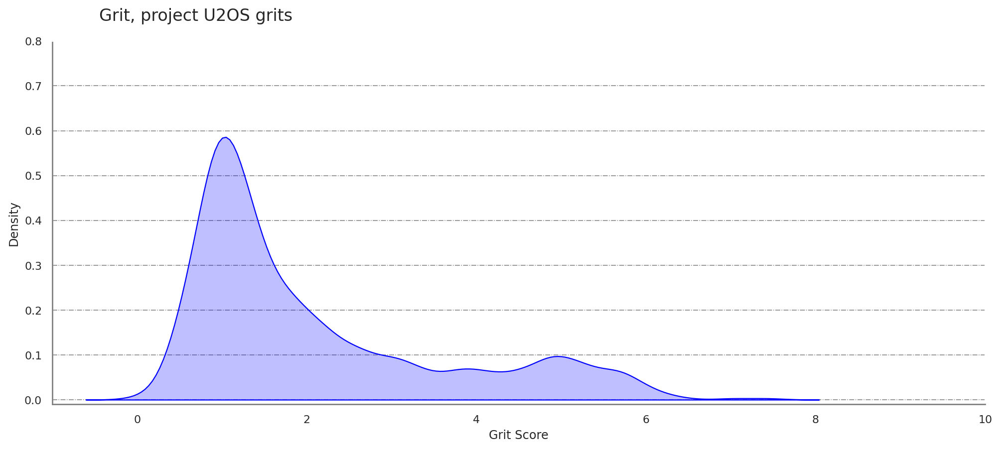

In [102]:
# visualize the grit scores with KDE plot

# Define your project name
project = 'U2OS grits'

# Initialize the figure and set its size
fig = plt.figure(figsize=(15, 6))

# Set Seaborn style and font size
sns.set(font_scale=0.9)

# Add a super title for the figure
fig.suptitle(
    f'Grit, project {project}',
    fontsize=15,
    x=0.3
)

# Define subplot layout (1 row, 1 column)
ax = fig.add_subplot(1, 1, 1)

# Create a KDE plot for Grit scores
sns.kdeplot(
    data=grit_scores_grouped['grit'],  # Assuming 'grit' is the column with Grit scores
    fill=True,
    color="blue",
    bw_adjust=0.5,
    ax=ax
)

# Customize plot appearance
ax.set_facecolor('w')
ax.spines['bottom'].set_color('grey')
ax.spines['left'].set_color('grey')
ax.set_ylim([-0.01, 0.8])  # Set y-axis limits as per your data distribution
ax.set_xlim([-1, 10])  # Match the x-axis to expected range of grit scores
ax.yaxis.grid(which="major", color='grey', linestyle='-.', linewidth=0.7)
plt.axhline(y=1, color='r', linestyle='-.')  # Optional: if you want a reference line at y=1
ax.set_xlabel('Grit Score')
ax.set_ylabel('Density')

# Display the plot
plt.show()

In [ ]:
# visualize the grit scores with KDE plot

# Define your project name
project = 'U2OS grits'

# Initialize the figure and set its size
fig = plt.figure(figsize=(15, 6))

# Set Seaborn style and font size
sns.set(font_scale=0.9)

# Add a super title for the figure
fig.suptitle(
    f'Grit, project {project}',
    fontsize=15,
    x=0.3
)

# Define subplot layout (1 row, 1 column)
ax = fig.add_subplot(1, 1, 1)

# Create a KDE plot for Grit scores
sns.kdeplot(
    data=grit_scores_grouped['grit'],  # Assuming 'grit' is the column with Grit scores
    fill=True,
    color="blue",
    bw_adjust=0.5,
    ax=ax
)

# Customize plot appearance
ax.set_facecolor('w')
ax.spines['bottom'].set_color('grey')
ax.spines['left'].set_color('grey')
ax.set_ylim([-0.01, 0.8])  # Set y-axis limits as per your data distribution
ax.set_xlim([-1, 10])  # Match the x-axis to expected range of grit scores
ax.yaxis.grid(which="major", color='grey', linestyle='-.', linewidth=0.7)
plt.axhline(y=1, color='r', linestyle='-.')  # Optional: if you want a reference line at y=1
ax.set_xlabel('Grit Score')
ax.set_ylabel('Density')

# Display the plot
plt.show()

/tmp/ipykernel_198573/2058109511.py:22: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'gray'}` instead.

  sns.barplot(
/tmp/ipykernel_198573/2058109511.py:22: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(


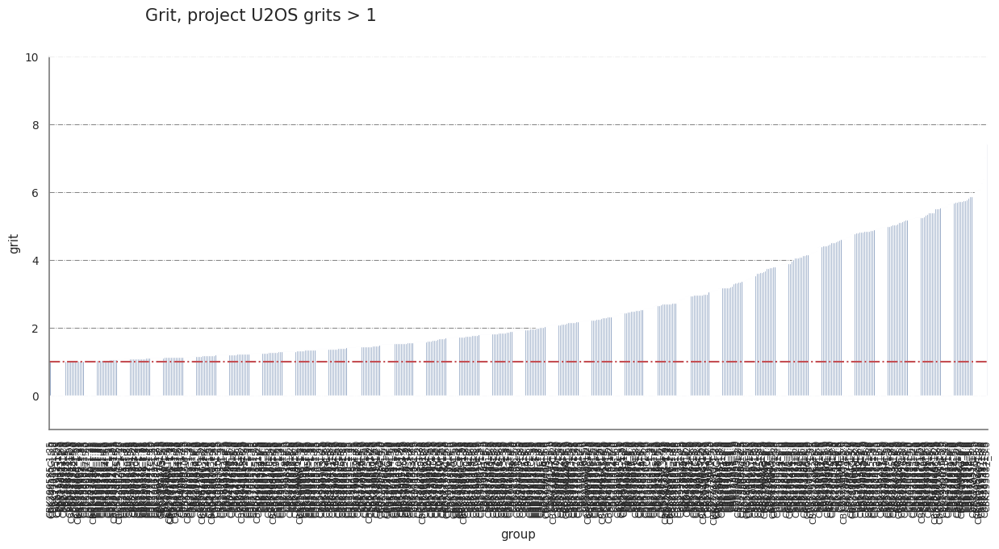

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns
project = 'U2OS grits > 1'

# Initialize the figure and set its size
fig = plt.figure(figsize=(15, 6))

# Set Seaborn style and font size
sns.set(font_scale=0.9)

# Add a super title for the figure
fig.suptitle(
    f'Grit, project {project}',
    fontsize=15,
    x=0.3
)

# Define subplot layout (1 row, 1 column)
ax = fig.add_subplot(1, 1, 1)

# Create a bar plot
sns.barplot(
    x="group",
    y="grit",
    data=df_grit_1,
    alpha=1,
    errcolor='gray',
    errwidth=2,
    ax=ax
)

# Customize plot appearance
ax.set_facecolor('w')
ax.spines['bottom'].set_color('grey')
ax.spines['left'].set_color('grey')
ax.set_ylim([-1, 10])  # Set y-axis limits
ax.yaxis.grid(which="major", color='grey', linestyle='-.', linewidth=0.7)
plt.axhline(y=1, color='r', linestyle='-.')  # Add a horizontal reference line
ax.tick_params(axis='x', which='major', labelsize=8, rotation=90)  # Customize x-axis tick labels

# Display the plot
# Define the filename
#ilename = "grit_barplot_{}".format(project)

plt.show()

In [66]:
# df_grit_4.tail(10)

In [67]:
import scanpy as sc
# Load the features data
features_df = U2OS_dfZscores

# Separate feature data and metadata
num_metadata_cols = 12
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata)


AnnData object with n_obs × n_vars = 15423 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [68]:
adata
print(adata.obs.head())  # Print the first few rows of metadata

  Metadata_Barcode Metadata_Well Metadata_Site  Count_nuclei compound_id  \
0          P015230           B02             1            72   CBK278070   
1          P015230           B02             2            78   CBK278070   
2          P015230           B02             3           137   CBK278070   
3          P015230           B02             4            93   CBK278070   
4          P015230           B02             5            82   CBK278070   

   cmpd_conc cmpd_name Family therapeutic_class_2023        ImageID  \
0       1.25   TGX-221    NaN                   PI3K  P015230_B02_1   
1       1.25   TGX-221    NaN                   PI3K  P015230_B02_2   
2       1.25   TGX-221    NaN                   PI3K  P015230_B02_3   
3       1.25   TGX-221    NaN                   PI3K  P015230_B02_4   
4       1.25   TGX-221    NaN                   PI3K  P015230_B02_5   

   ReplicateGroup                     Replicate  
0  CBK278070_1.25  CBK278070_1.25_P015230_B02_1  
1  CBK278070_1.2

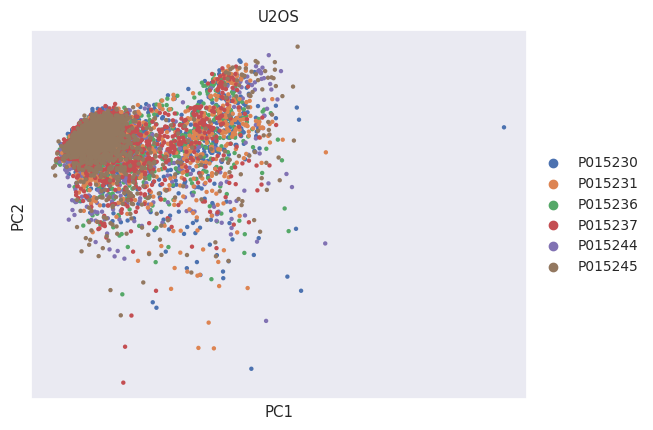

In [69]:
#Compute PCA
sc.tl.pca(adata)
sc.pl.pca(
    adata,
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    title='U2OS',         # Plot title
    size=40,                          # Size of points)

)

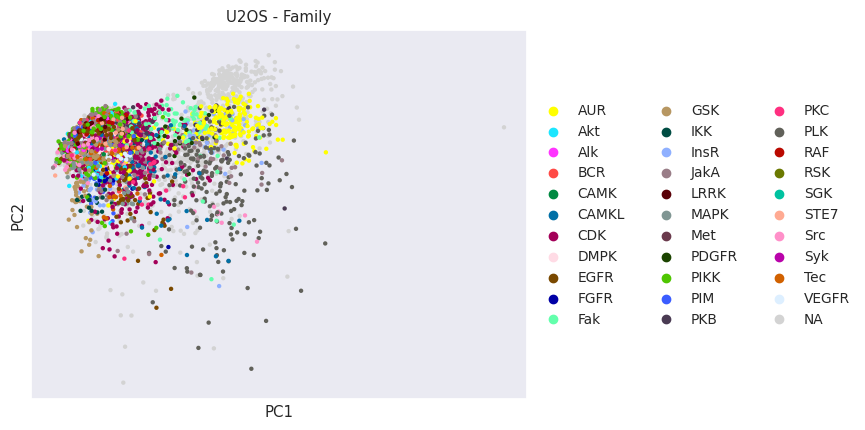

In [70]:
#Compute PCA
sc.tl.pca(adata)
sc.pl.pca(
    adata,
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    size=40,                          # Size of points)

)

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


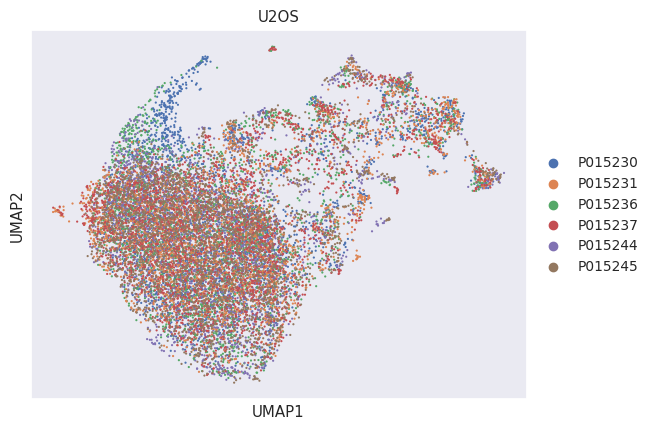

In [71]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
#fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    title='U2OS',         # Plot title
    size=10,                          # Size of points)

)

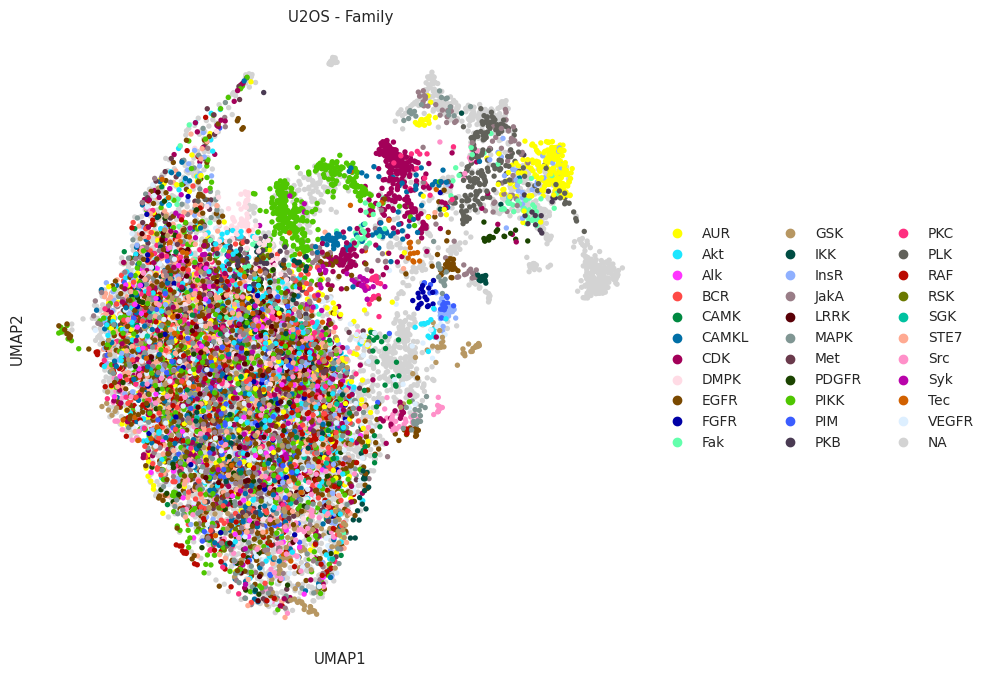

In [72]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

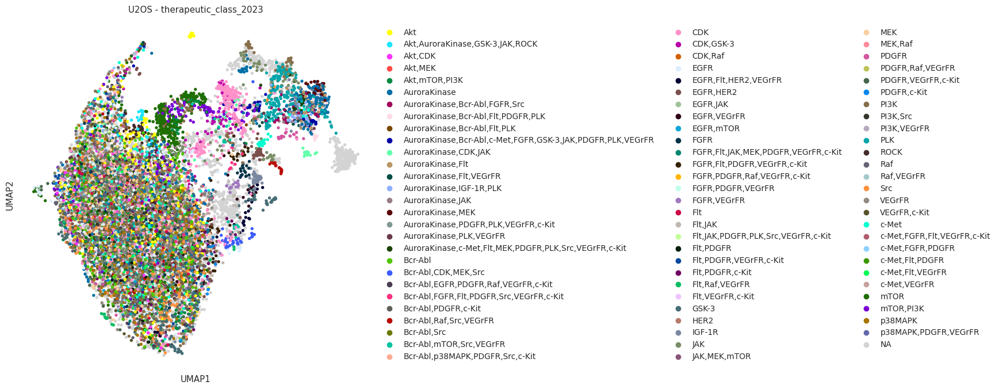

In [73]:
# Compute UMAP
sc.pp.neighbors(adata)  # This computes the neighborhood graph
sc.tl.umap(adata)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='therapeutic_class_2023',                  # Replace with actual metadata column name
    title='U2OS - therapeutic_class_2023',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

In [74]:
#sc.pl.clustermap(adata,cmap='RdBu_r',figsize=(20, 20), cbar_pos=(0.05, 0.2, 0.03, 0.1))

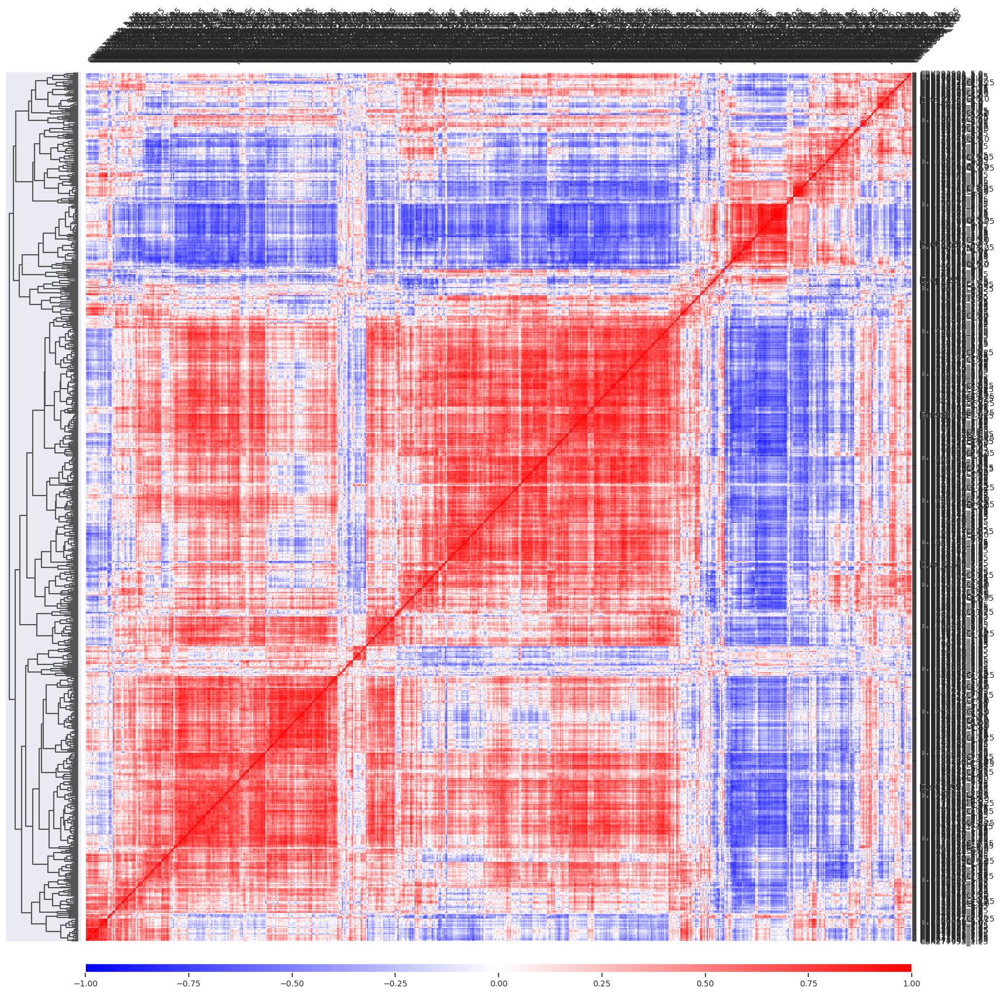

In [75]:
# Plot the correlation matrix
#sc.set_figure_params(scanpy=True, fontsize=18)
ax = sc.pl.correlation_matrix(adata, "ReplicateGroup", figsize=(20, 20))

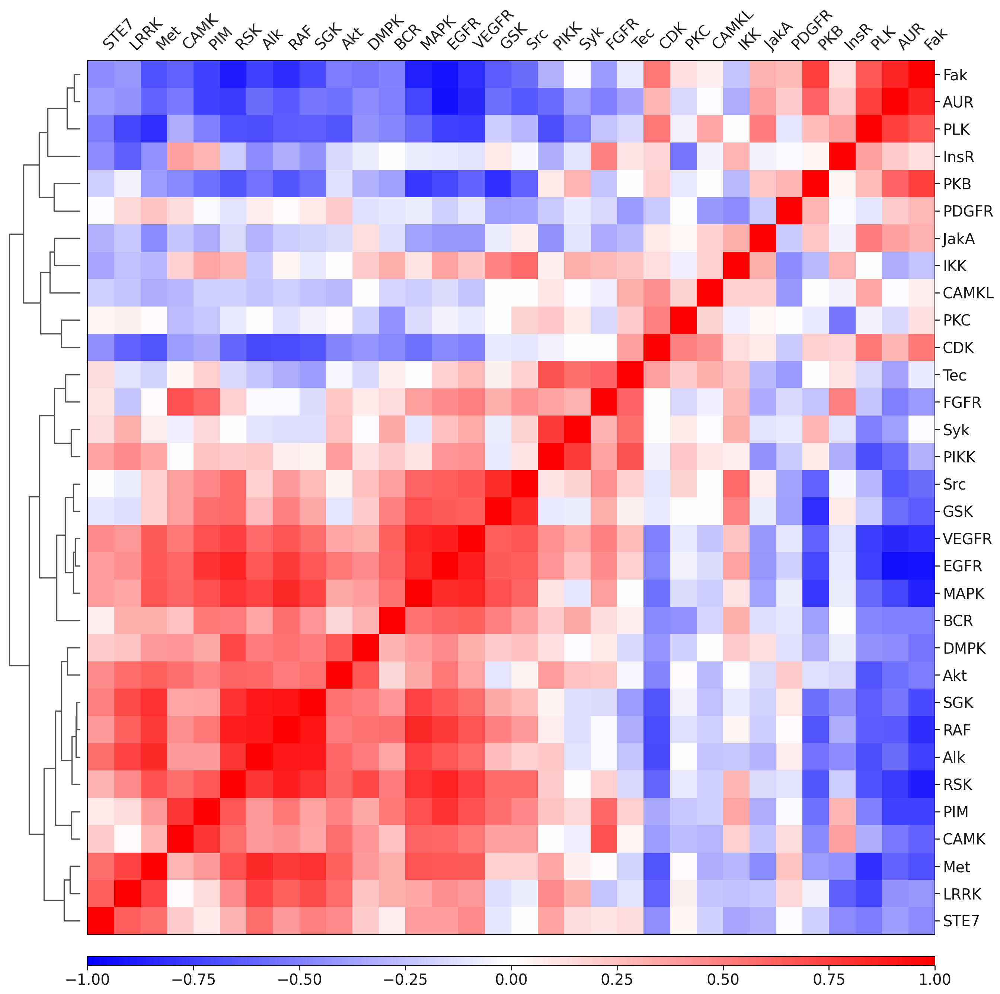

In [76]:
# Plot the correlation matrix
sc.set_figure_params(scanpy=True, fontsize=18)
ax = sc.pl.correlation_matrix(adata, "Family", figsize=(20, 20))

## TRY REMOVING LOW CONCENTRATION OF COMPOUNDS

### GRITS HIGHER THAN 1

In [281]:
df_grit_1


,grit,Count_nuclei,dose,compound,ReplicateGroup
0,0.992269,161.333333,1.25,CBK290585,CBK290585_1.25
1,0.993023,136.277778,5.00,CBK288330G,CBK288330G_5.0
2,0.995473,165.222222,1.25,CBK293883,CBK293883_1.25
3,0.995933,157.222222,5.00,CBK277995,CBK277995_5.0
4,0.997898,179.611111,1.25,CBK277942,CBK277942_1.25
...,...,...,...,...,...
562,6.071432,119.500000,5.00,CBK277987,CBK277987_5.0
563,6.262094,71.166667,1.25,CBK277955,CBK277955_1.25
564,6.369613,82.388889,5.00,CBK288341,CBK288341_5.0
565,7.022797,110.500000,1.25,CBK288341,CBK288341_1.25


In [282]:
df_grit_1 = df_grit_1.reset_index(drop=True)
df_grit_1['ReplicateGroup'] = df_grit_1['compound'] + '_' + df_grit_1['dose'].astype(str) 
display(df_grit_1)

,grit,Count_nuclei,dose,compound,ReplicateGroup
0,0.992269,161.333333,1.25,CBK290585,CBK290585_1.25
1,0.993023,136.277778,5.00,CBK288330G,CBK288330G_5.0
2,0.995473,165.222222,1.25,CBK293883,CBK293883_1.25
3,0.995933,157.222222,5.00,CBK277995,CBK277995_5.0
4,0.997898,179.611111,1.25,CBK277942,CBK277942_1.25
...,...,...,...,...,...
562,6.071432,119.500000,5.00,CBK277987,CBK277987_5.0
563,6.262094,71.166667,1.25,CBK277955,CBK277955_1.25
564,6.369613,82.388889,5.00,CBK288341,CBK288341_5.0
565,7.022797,110.500000,1.25,CBK288341,CBK288341_1.25


In [283]:
U2OS_dfZscores

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate
0,-1.795443,-2.226389,-2.188277,0.279302,-2.115006,0.333097,-2.149275,0.307541,-1.138062,-1.828354,-1.744247,-2.338716,2.610160,1.2

In [284]:
U2OS_dfZscores_1grit = U2OS_dfZscores.copy()
# Add a new column to df_U2OS, initialized to 0
U2OS_dfZscores_1grit['higher_than_one_grit'] = 0

# Count occurrences of each compound in df_Low_grit_1
U2OS_dfZscores_1grit['higher_than_one_grit'] = U2OS_dfZscores_1grit['ReplicateGroup'].apply(
    lambda x: (df_grit_1['ReplicateGroup'] == x).sum()
)

# Display the updated DataFrame
display(U2OS_dfZscores_1grit.head(2))

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit
0,-1.795443,-2.226389,-2.188277,0.279302,-2.115006,0.333097,-2.149275,0.307541,-1.138062,-1.828354,-1.744247,-2.338716,2.610160,1.271353,-2.601135,-2.592112,-1.417202,-1.6

In [285]:
U2OS_dfZscores_1grit.higher_than_one_grit.unique()
# Count the number of rows where 'higher_than_one_grit' is 0
num_rows_with_zero = (U2OS_dfZscores_1grit['higher_than_one_grit'] == 0).sum()
print(f"Number of rows with 0 in 'higher_than_one_grit': {num_rows_with_zero}")

Number of rows with 0 in 'higher_than_one_grit': 4769


In [286]:
# Display rows with NaN values in the "Family" column before dropping
nan_family_rows = U2OS_dfZscores_1grit[
    (U2OS_dfZscores_1grit['higher_than_one_grit'] == 1) | 
    (U2OS_dfZscores_1grit['compound_id'] == '[dmso]')
]

# Select only rows where "Family" is NaN
nan_family_rows = nan_family_rows[nan_family_rows['Family'].isna()]

# Display the rows with NaN in "Family"
display(nan_family_rows.tail(10))

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit
15378,-0.304147,-0.514010,2.808218,-2.090031,2.815430,-2.075119,2.794827,-2.081591,-0.274721,-0.278523,-0.631001,0.004338,0.796338,-0.171195,-0.162168,-0.144827,0.006798,0

In [287]:
# First, filter based on conditions
filtered_df_g1 = U2OS_dfZscores_1grit[
    (U2OS_dfZscores_1grit['higher_than_one_grit'] == 1) | 
    (U2OS_dfZscores_1grit['compound_id'] == '[dmso]')
]

# Assign 'dmso' to 'Family' column for rows where 'compound_id' is 'dmso' and 'Family' is NaN
filtered_df_g1.loc[
    (filtered_df_g1['compound_id'] == '[dmso]') & (filtered_df_g1['Family'].isna()), 
    'Family'
] = 'dmso'

# Drop remaining rows with NaN in 'Family' and reset index
filtered_df_g1 = filtered_df_g1.dropna(subset=['Family']).reset_index(drop=True)
filtered_df_g1 = filtered_df_g1.merge(df_grit_1[['ReplicateGroup', 'grit']], on='ReplicateGroup', how='left')
# Display the result
filtered_df_g1

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit,grit
0,-3.188556,-3.521105,1.632595,-4.977559,1.706048,-4.908704,1.669987,-4.938007,-2.547724,-3.244291,-2.286628,-3.277960,2.960553,2.559388,-3.754266,-3.828512,-1.867068,-2.086328,-2.086453,-2.113602,-1.937876,0.387027,-3.697332,1

In [288]:
filtered_df_g1.compound_id.unique()  

array(['CBK278013', 'CBK041209', 'CBK290556', 'CBK290660', 'CBK277966',
       'CBK290567', 'CBK290480', '[dmso]', 'CBK293852', 'CBK277936',
       'CBK288288', 'CBK288312', 'CBK288299', 'CBK288286G', 'CBK290253',
       'CBK041232C', 'CBK277993', 'CBK277967', 'CBK290527N', 'CBK277977',
       'CBK290484', 'CBK278001', 'CBK288328', 'CBK288278', 'CBK288289',
       'CBK278119G', 'CBK016914', 'CBK277995', 'CBK290482', 'CBK288272',
       'CBK288253C', 'CBK288298', 'CBK201383', 'CBK290339', 'CBK277956',
       'CBK041801', 'CBK288257', 'CBK277987', 'CBK176260', 'CBK288295',
       'CBK288329', 'CBK288256', 'CBK288275', 'CBK200518C', 'CBK277927',
       'CBK288280', 'CBK278051', 'CBK277972', 'CBK290845', 'CBK277955',
       'CBK277980', 'CBK277959', 'CBK277921', 'CBK288270', 'CBK278067',
       'CBK288285', 'CBK277962', 'CBK290649', 'CBK288266', 'CBK277922C',
       'CBK288255', 'CBK277925', 'CBK288268', 'CBK288307', 'CBK288311',
       'CBK277971C', 'CBK290756', 'CBK041168', 'CBK041167G',

In [289]:
print(filtered_df_g1.Family.value_counts())
# # Remove rows with NaN values in the "Family" column and reset the index
# filtered_df_g1 = filtered_df_g1.dropna(subset=['Family']).reset_index(drop=True)

# # Verify the result
# display(filtered_df_g1.head())

Family
dmso     1080
EGFR      721
PIKK      694
CDK       568
STE7      467
AUR       455
JakA      430
MAPK      425
RAF       340
VEGFR     288
Akt       267
GSK       250
InsR      216
PLK       203
BCR       198
CAMKL     173
Src       161
DMPK      144
PKC       143
Fak       140
Syk       126
Met       125
IKK       108
PKB       108
PIM       107
PDGFR      90
RSK        88
Tec        72
LRRK       54
CAMK       54
Alk        52
FGFR       36
Name: count, dtype: int64


In [290]:
filtered_df_g1.Family.unique()

array(['VEGFR', 'MAPK', 'DMPK', 'PIM', 'STE7', 'PLK', 'InsR', 'dmso',
       'CDK', 'AUR', 'PIKK', 'RAF', 'Met', 'PKB', 'EGFR', 'PKC', 'Akt',
       'Src', 'BCR', 'JakA', 'GSK', 'Fak', 'PDGFR', 'Syk', 'CAMKL', 'RSK',
       'FGFR', 'IKK', 'CAMK', 'LRRK', 'Tec', 'Alk'], dtype=object)

In [291]:
filtered_df_g1.cmpd_conc.unique()

array([5.  , 1.25, 0.05])

In [292]:
filtered_df_g1.cmpd_conc.value_counts()

cmpd_conc
5.00    3869
1.25    3434
0.05    1080
Name: count, dtype: int64

In [293]:
#filtered_df_g1.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_filtered_df_g1.csv', sep=';', index=False)

In [294]:
filtered_df_g1

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,AreaShape_Zernike_7_5_nuclei,AreaShape_Zernike_7_7_nuclei,AreaShape_Zernike_8_0_nuclei,AreaShape_Zernike_8_2_nuclei,AreaShape_Zernike_8_4_nuclei,AreaShape_Zernike_8_6_nuclei,AreaShape_Zernike_8_8_nuclei,AreaShape_Zernike_9_1_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_5_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit,grit
0,-3.188556,-3.521105,1.632595,-4.977559,1.706048,-4.908704,1.669987,-4.938007,-2.547724,-3.244291,-2.286628,-3.277960,2.960553,2.559388,-3.754266,-3.828512,-1.867068,-2.086328,-2.086453,-2.113602,-1.937876,0.387027,-3.697332,1

In [295]:
import scanpy as sc
# Load the features data
features_df = filtered_df_g1

# Separate feature data and metadata
num_metadata_cols = 14
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata_filtered = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_filtered)

AnnData object with n_obs × n_vars = 8383 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


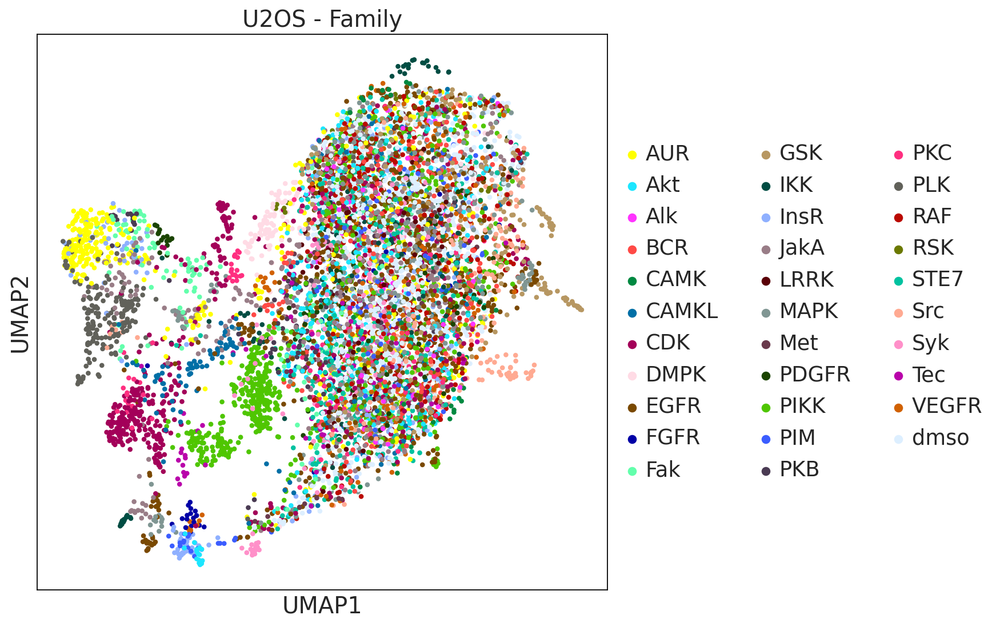

In [319]:
# Compute UMAP
sc.pp.neighbors(adata_filtered)  # This computes the neighborhood graph
sc.tl.umap(adata_filtered)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_filtered)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_filtered,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Family',                  # Replace with actual metadata column name
    title='U2OS - Family',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)




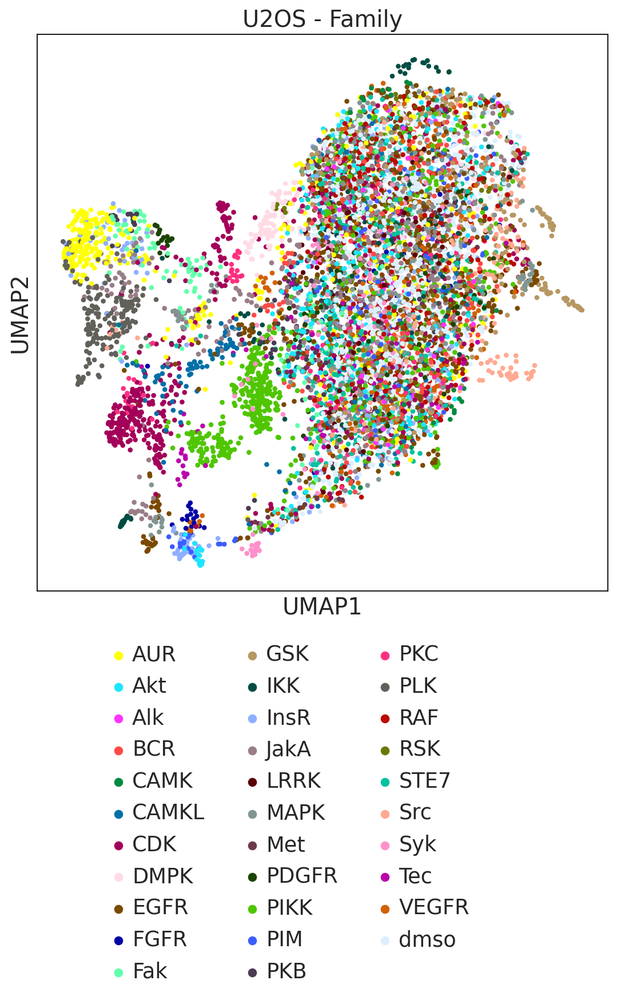

In [329]:
# Compute UMAP coordinates
sc.pp.neighbors(adata_filtered)  # Compute the neighborhood graph
sc.tl.umap(adata_filtered)       # Compute UMAP coordinates

# Set up the figure
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to white or any color you prefer

# Plot UMAP
sc.pl.umap(
    adata_filtered,
    color='Family',                  # Metadata column name for coloring
    title='U2OS - Family',           # Plot title
    ax=ax,
    size=60,                         # Size of points
    show=False                       # Prevent automatic display
)

# Adjust legend position
#ax.legend_.set_title("Family")
ax.legend_.set_bbox_to_anchor((0.1, -0.4))  # Set legend position



plt.show()

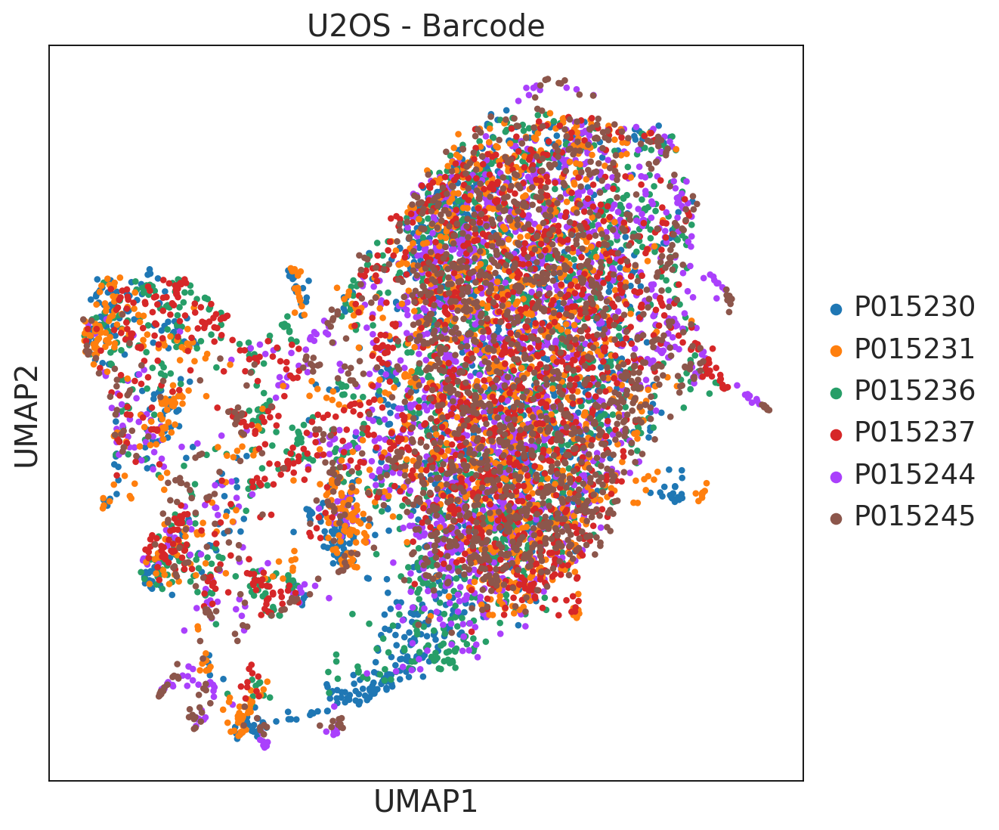

In [297]:
# Compute UMAP
sc.pp.neighbors(adata_filtered)  # This computes the neighborhood graph
sc.tl.umap(adata_filtered)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_filtered)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_filtered,
    color='Metadata_Barcode',                  # Replace with actual metadata column name
    #color='Family',                  # Replace with actual metadata column name
    title='U2OS - Barcode',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

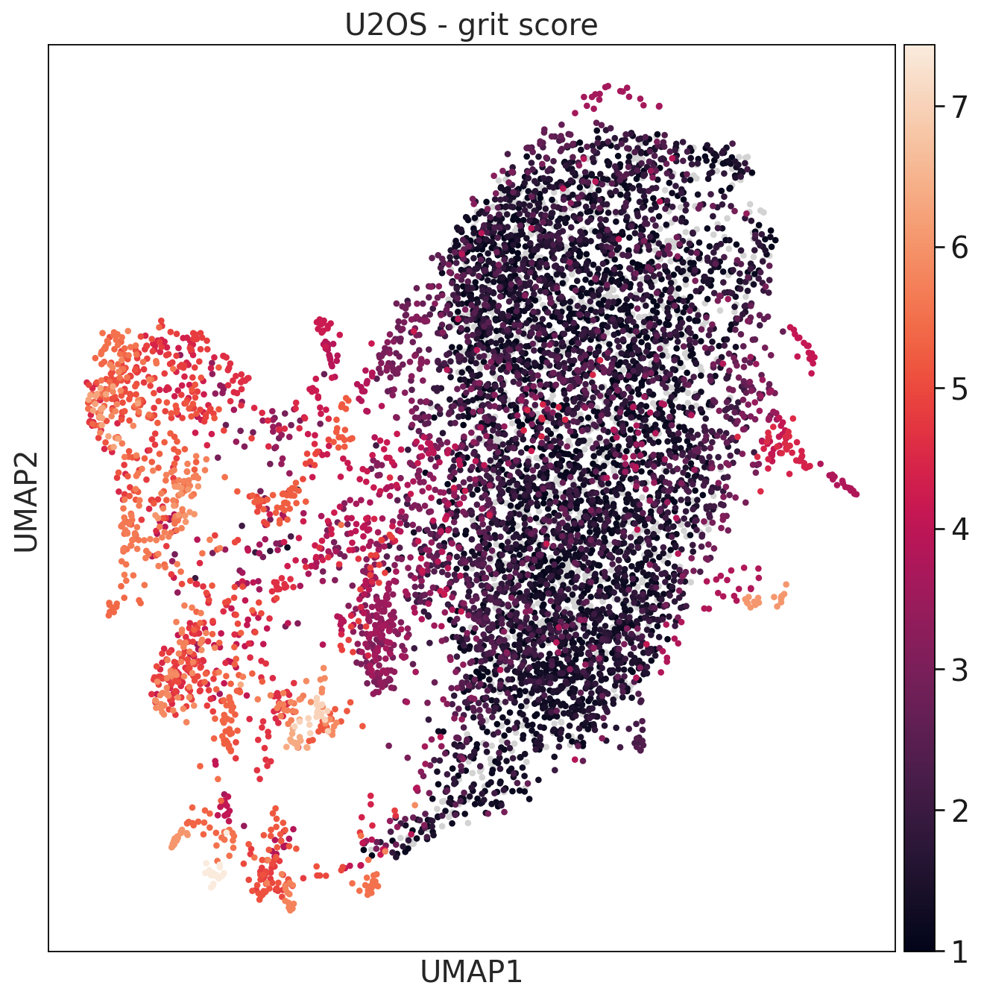

In [317]:
import scanpy as sc
import matplotlib.pyplot as plt

# Assuming adata_filtered is already defined and preprocessed
sc.pp.neighbors(adata_filtered)  # Computes the neighborhood graph
sc.tl.umap(adata_filtered)       # Computes the UMAP coordinates

# Create the UMAP plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_facecolor('white')  # Set background color to white

# Create UMAP plot and save the figure
sc.pl.umap(
    adata_filtered,
    color='grit',  # Replace with actual metadata column name
    title='U2OS - grit score',  # Plot title
    ax=ax,
    size=60,  # Size of points
    show=False  # Don't show the plot yet
)

# # Now modify the legend if it exists
# if ax.get_legend() is not None:
#     ax.legend(ncol=4, loc='upper center', bbox_to_anchor=(0.5, -0.1), fontsize='small')  # Position below the plot

# # Adjust layout to prevent overlap
# plt.tight_layout()

# Finally, display the plot
plt.show()

In [299]:
### test

In [338]:
import scanpy as sc
# Load the features data
features_df = filtered_df_g1
features_df =filtered_df_g1[features_df.Family =='PIKK']
# Separate feature data and metadata
num_metadata_cols = 14
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

# Create AnnData object with feature data
adata_compound = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_compound)

AnnData object with n_obs × n_vars = 694 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1728 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


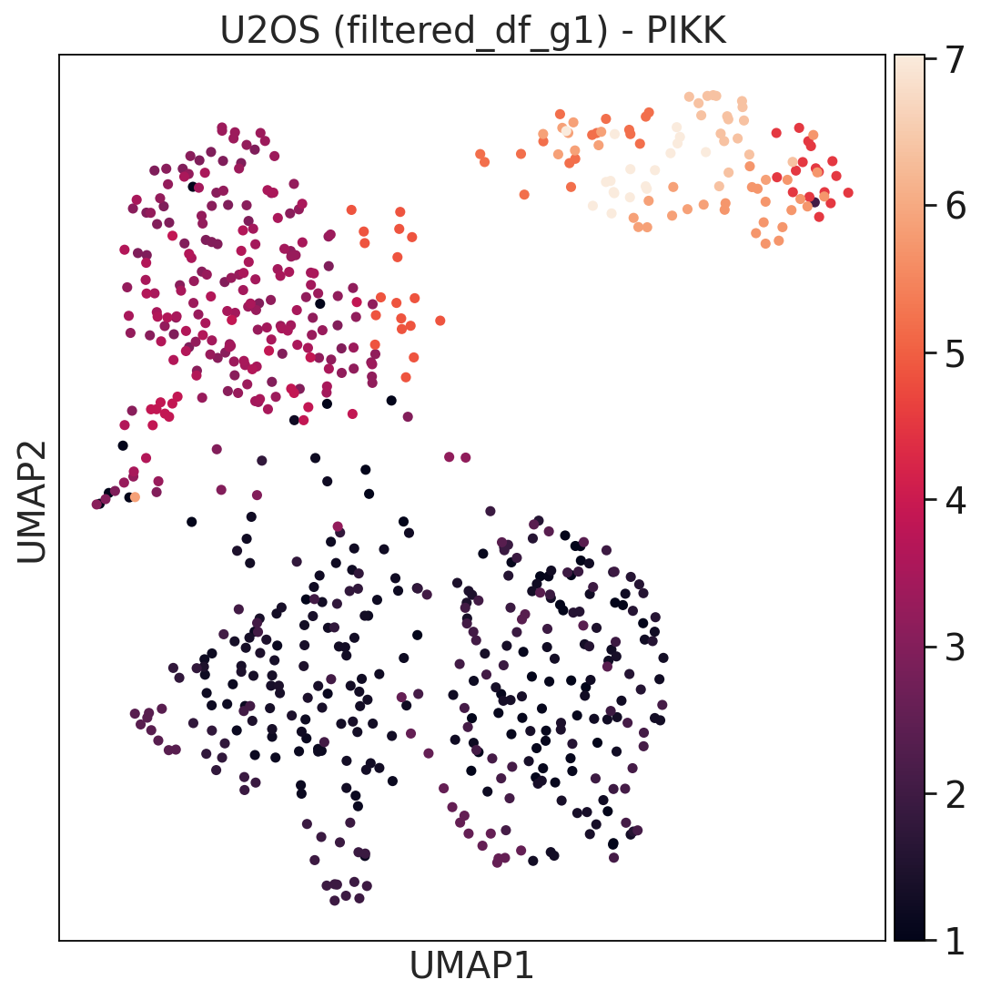

In [339]:
# Compute UMAP
sc.pp.neighbors(adata_compound)  # This computes the neighborhood graph
sc.tl.umap(adata_compound)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_compound)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_compound,
    color='grit',                  # Replace with actual metadata column name
    title='U2OS (filtered_df_g1) - PIKK',         # Plot titleJaKa
    ax=ax,
    size=100,                          # Size of points)
)

In [302]:
# # Load the features data
# features_df_5uM = df_5uM
# features_df_5uM =df_5uM[features_df_5uM.Family =='JakA']
# # Separate feature data and metadata
# num_metadata_cols = 13
# feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
# metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# # Ensure that metadata has the same row indices as feature data
# if not feature_data_df.index.equals(metadata_df.index):
#     raise ValueError("The indices of feature data and metadata do not match.")

# # Create AnnData object with feature data
# adata_compound_5uM = sc.AnnData(X=feature_data_df,obs=metadata_df)

# print(adata_compound_5uM)


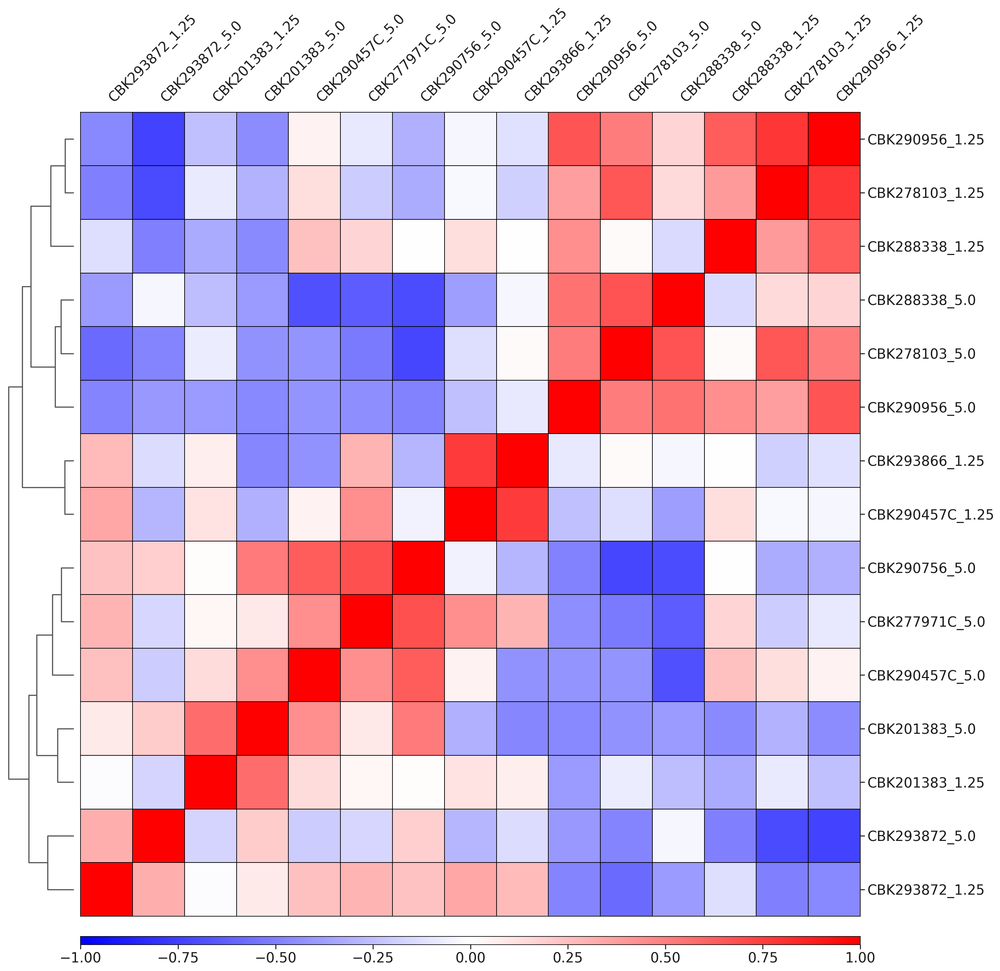

In [303]:
# Plot the correlation matrix
sc.set_figure_params(scanpy=True, fontsize=18)
ax = sc.pl.correlation_matrix(adata_compound, "ReplicateGroup", figsize=(20, 20))

### Separating based on concentration

In [304]:
# Create separate DataFrames for each concentration
df_5uM = filtered_df_g1[filtered_df_g1['cmpd_conc'] == 5.00].reset_index(drop=True)
df_1_25uM = filtered_df_g1[filtered_df_g1['cmpd_conc'] == 1.25].reset_index(drop=True)
df_0_05uM = filtered_df_g1[filtered_df_g1['cmpd_conc'] == 0.05].reset_index(drop=True)

# # Display the DataFrames
# print("DataFrame for 5.00 µM concentration:")
# display(df_5uM.head(3))

# print("DataFrame for 1.25 µM concentration:")
# display(df_1_25uM.head(3))

# print("DataFrame for 0.05 µM concentration:")
# display(df_0_05uM.head(3))

In [305]:
df_5uM.Family.unique()  

array(['VEGFR', 'PLK', 'AUR', 'Met', 'DMPK', 'PIKK', 'PKB', 'CDK', 'EGFR',
       'PKC', 'RAF', 'Akt', 'STE7', 'Src', 'BCR', 'InsR', 'JakA', 'GSK',
       'MAPK', 'PIM', 'Fak', 'Syk', 'RSK', 'CAMKL', 'PDGFR', 'IKK',
       'FGFR', 'Tec', 'CAMK', 'Alk', 'LRRK'], dtype=object)

In [306]:
import scanpy as sc
# Load the features data
features_df_5uM = df_5uM

# Separate feature data and metadata
num_metadata_cols = 14
feature_data_df = features_df_5uM.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df_5uM.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")


# Create AnnData object with feature data
adata_5uM = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_5uM)

AnnData object with n_obs × n_vars = 3869 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [307]:
adata_5uM.obs.cmpd_conc.unique()

array([5.])

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1728 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


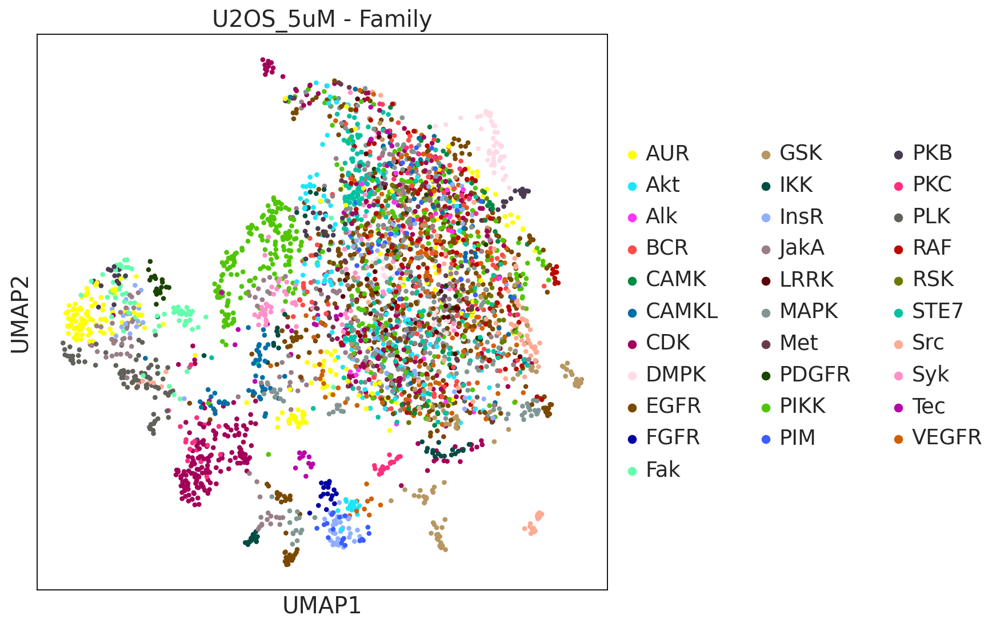

In [308]:
# Compute UMAP
sc.pp.neighbors(adata_5uM)  # This computes the neighborhood graph
sc.tl.umap(adata_5uM)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_5uM)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_5uM,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='Family',                  # Replace with actual metadata column name
    title='U2OS_5uM - Family',         # Plot title
    ax=ax,
    size=60,                          # Size of points)
)

In [340]:
import scanpy as sc
# Load the features data
features_df_5uM = df_5uM[df_5uM.Family =='PIKK']

# Separate feature data and metadata
num_metadata_cols = 14
feature_data_df = features_df_5uM.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df_5uM.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")


# Create AnnData object with feature data
adata_5uM_cmp = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_5uM_cmp)

AnnData object with n_obs × n_vars = 371 × 1728
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 1728 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


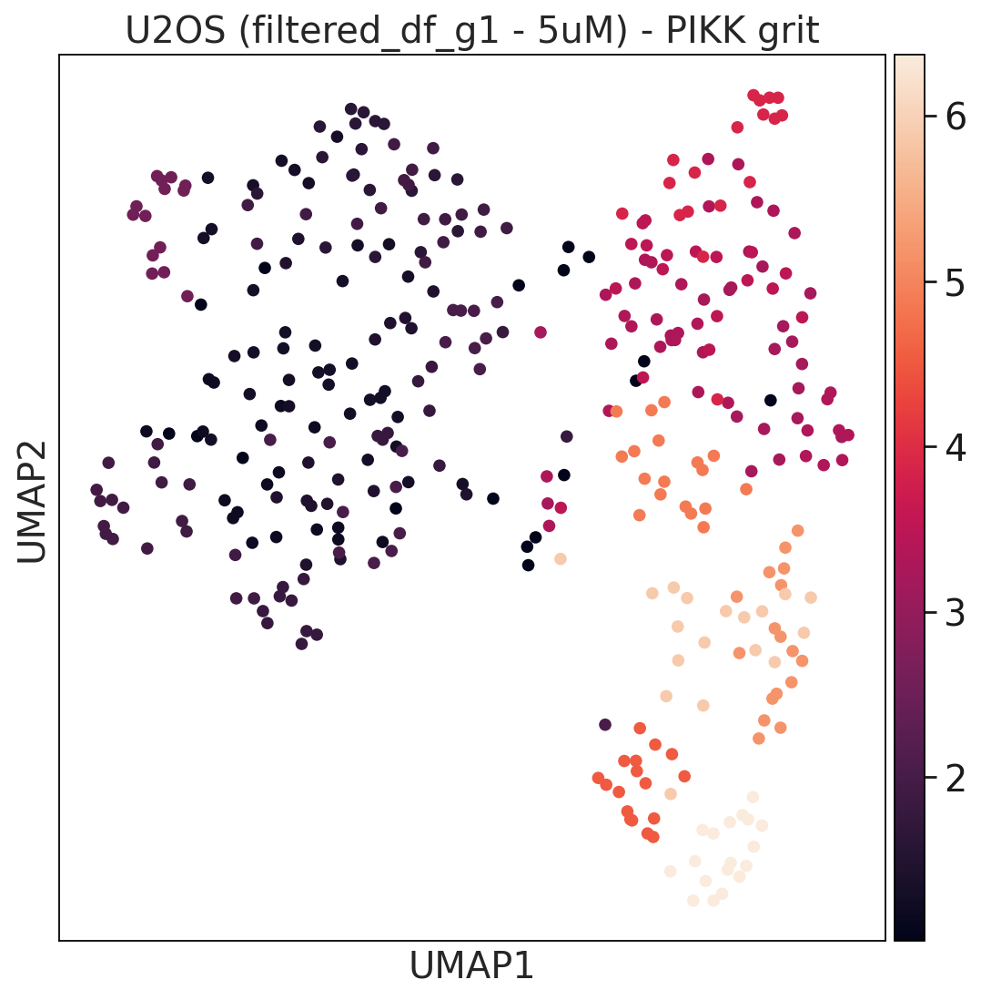

In [341]:
# Compute UMAP
sc.pp.neighbors(adata_5uM_cmp)  # This computes the neighborhood graph
sc.tl.umap(adata_5uM_cmp)       # This computes the UMAP coordinates

# Set the figure size
#plt.figure(figsize=(30, 20))  # Adjust the size if needed
sc.tl.umap(adata_5uM_cmp)
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

sc.pl.umap(
    adata_5uM_cmp,
    #color='Metadata_Barcode',                  # Replace with actual metadata column name
    color='grit',                  # Replace with actual metadata column name
    title='U2OS (filtered_df_g1 - 5uM) - PIKK grit',         # Plot title
    ax=ax,
    size=150,                          # Size of points)
)

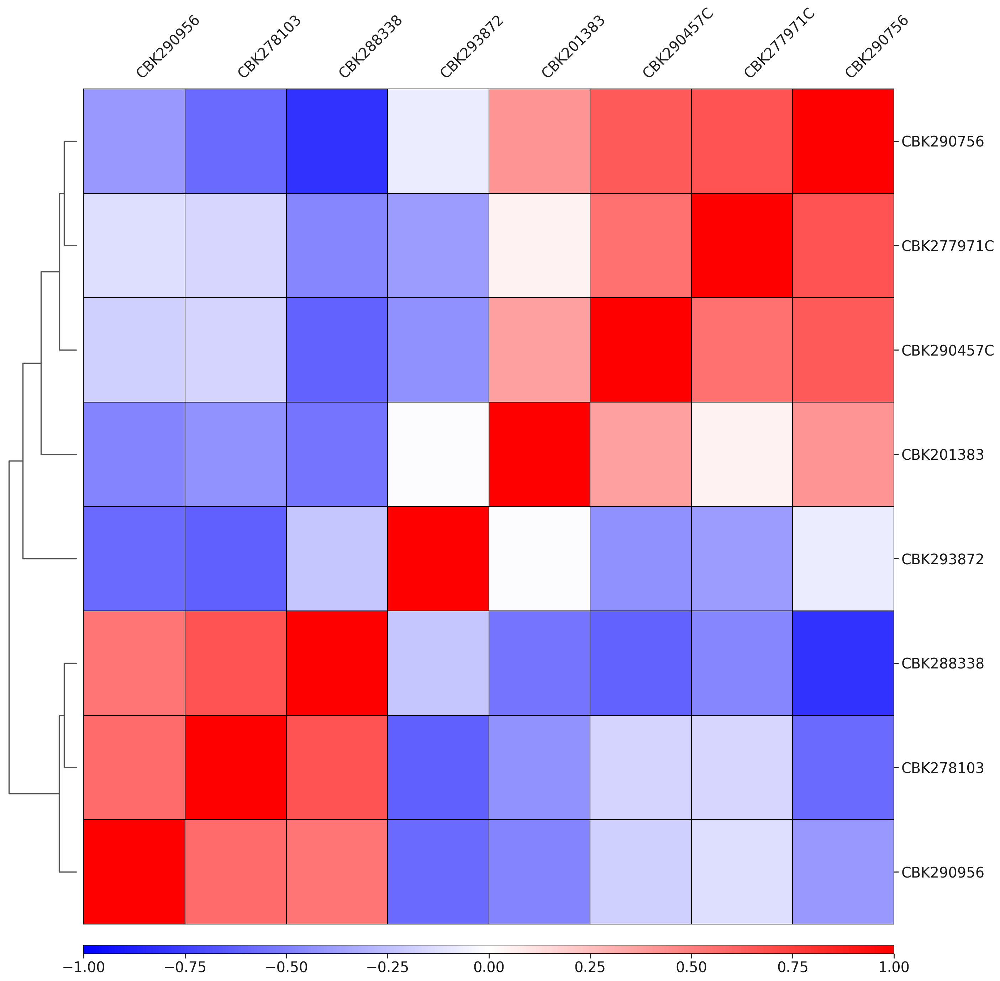

In [313]:
ax = sc.pl.correlation_matrix(adata_5uM_cmp, "compound_id", figsize=(20, 20))